https://towardsdatascience.com/nlp-part-3-exploratory-data-analysis-of-text-data-1caa8ab3f79d

In [22]:
import pandas as pd
import numpy as np
import nltk
import pickle
from collections import Counter
from textblob import TextBlob
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("concatenated_dataset_4-23.csv")
#create new DataFrame and only keep 'text' and 'created_at' columns
df = df[['Time','Text', 'Entities','Public Metrics','Union']]

df #new data

,Time,Text,Entities,Public Metrics,Union
0,2020-10-09T21:24:36.000Z,These members of Congress are standing up and ...,"{'urls': [{'start': 110, 'end': 133, 'url': 'h...","{'retweet_count': 3, 'reply_count': 0, 'like_c...",AFGENational
1,2022-06-22T17:38:01.000Z,EPA lab work in Houston is suffering as plans ...,"{'hashtags': [{'start': 84, 'end': 87, 'tag': ...","{'retweet_count': 0, 'reply_count': 0, 'like_c...",AFGENational
2,2022-06-16T19:41:01.000Z,Learn more about the EPA Council's upcoming co...,"{'urls': [{'start': 63, 'end': 86, 'url': 'htt...","{'retweet_count': 1, 'reply_count': 0, 'like_c...",AFGENational
3,2022-06-10T19:14:01.000Z,AFGE EPA members are gearing up for contract n...,"{'hashtags': [{'start': 114, 'end': 117, 'tag'...","{'retweet_count': 2, 'reply_count': 0, 'like_c...",AFGENational
4,2022-04-25T18:05:03.000Z,AFGE EPA leaders are pushing for a clause in t...,"{'hashtags': [{'start': 131, 'end': 134, 'tag'...","{'retweet_count': 2, 'reply_count': 0, 'like_c...",AFGENational
...,...,...,...,...,...
8494,2012-05-14T21:40:04.000Z,RT @UnionPlus: Miss this? READING: Former coal...,"{'hashtags': [{'start': 133, 'end': 136, 'tag'...","{'retweet_count': 0, 'reply_count': 1, 'like_c...",unitehere
8495,2012-04-20T20:05:14.000Z,98 years ago today the Colorado National Guard...,"{'annotations': [{'start': 23, 'end': 45, 'pro...","{'retweet_count': 2, 'reply_count': 1, 'like_c...",unitehere
8496,2012-03-06T21:50:04.000Z,100 years before OSHA - these kids were workin...,"{'urls': [{'start': 85, 'end': 105, 'url': 'ht...","{'retweet_count': 1, 'reply_count': 0, 'like_c...",unitehere
8497,2012-02-27T21:35:06.000Z,WOO! New Contract Ratified at Consol Energy C...,"{'hashtags': [{'start': 53, 'end': 56, 'tag': ...","{'retweet_count': 0, 'reply_count': 0, 'like_c...",unitehere


In [3]:
#often, we want to remove stopwords
stopwords = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'your', 'yours', 
                     'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', 'her', 'hers', 'herself', 
                     'it', 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 
                     'who', 'whom', 'this', 'that', 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 
                     'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 
                     'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 
                     'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 
                     'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 
                     'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 
                     'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 
                     'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 'can', 'will',
                     'just', 'dont', 'should', 'aint', 'arent', 'couldn', 'could', 'would', 'much', 'must',
                     'didnt', 'doesnt', 'hadnt', 'hasnt', 'havent', 'isnt', 'mightnt', 'mustnt', 'neednt', 'shan',
                     'shouldnt', 'wasnt', 'werent', 'wont', 'wouldnt','rt','mt','amp','mil','ve','don','s','st','pres','req','aft','ua']

In [4]:
 #adopted from catriscode, https://catriscode.com/2021/05/01/tweets-cleaning-with-python/

import numpy as np
import re

def clean_tweet(tweet):
    raw_tweet = str(tweet)
    if type(tweet) == float:
        return ""
    temp = re.sub("'", "", str(tweet)) # to avoid removing contractions in english
    temp = temp.lower()
    temp = re.sub("@[A-Za-z0-9_]+","", temp)
    temp = re.sub("#[A-Za-z0-9_]+","", temp)
    temp = re.sub(r'http\S+', '', temp)
    temp = re.sub(r"www.\S+", "", temp)
    temp = re.sub('[()!?]', ' ', temp)
    temp = re.sub('\[.*?\]',' ', temp)
    #temp = re.sub("[^a-z0-9]"," ", temp) # this removes all letters including CO2
    temp = re.sub("[^a-z]"," ", temp)
    temp = temp.split()
    temp = [w for w in temp if not w in stopwords]
    temp = " ".join(word for word in temp)
    
    if temp is None:
        print (raw_tweet,temp)
        
    return temp

In [5]:
df['clean_text'] = df['Text'].apply(clean_tweet)

In [6]:
df.to_csv('Twitter Cleaned Text.csv')

In [7]:
df = df.dropna(subset=['clean_text'])
df
#empty data with cleaning procedure

#`reset_index()`will recreate index column every time we run it on same data 
#`drop = True` paramater won’t create that as column in the dataframe, look at the difference between following two dataset
df = df.reset_index(drop=False) 

# Focus on the Union, Public Metrics, and the Texts

In [8]:
df_sentiment = df[['Union','clean_text', 'Public Metrics']]
df_sentiment.head()

,Union,clean_text,Public Metrics
0,AFGENational,members congress standing demanding halt reope...,"{'retweet_count': 3, 'reply_count': 0, 'like_c..."
1,AFGENational,epa lab work houston suffering plans relocate ...,"{'retweet_count': 0, 'reply_count': 0, 'like_c..."
2,AFGENational,learn epa councils upcoming contract campaign,"{'retweet_count': 1, 'reply_count': 0, 'like_c..."
3,AFGENational,afge epa members gearing contract negotiations...,"{'retweet_count': 2, 'reply_count': 0, 'like_c..."
4,AFGENational,afge epa leaders pushing clause union contract...,"{'retweet_count': 2, 'reply_count': 0, 'like_c..."


# Sentiment Analysis

In [9]:
from textblob import TextBlob
# create a sentiment column and apply a polarity rating
df_sentiment['sentiment'] = df_sentiment['clean_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_sentiment.head()

C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\2407887918.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sentiment['sentiment'] = df_sentiment['clean_text'].apply(lambda x: TextBlob(x).sentiment.polarity)


,Union,clean_text,Public Metrics,sentiment
0,AFGENational,members congress standing demanding halt reope...,"{'retweet_count': 3, 'reply_count': 0, 'like_c...",0.0
1,AFGENational,epa lab work houston suffering plans relocate ...,"{'retweet_count': 0, 'reply_count': 0, 'like_c...",0.0
2,AFGENational,learn epa councils upcoming contract campaign,"{'retweet_count': 1, 'reply_count': 0, 'like_c...",0.0
3,AFGENational,afge epa members gearing contract negotiations...,"{'retweet_count': 2, 'reply_count': 0, 'like_c...",0.0
4,AFGENational,afge epa leaders pushing clause union contract...,"{'retweet_count': 2, 'reply_count': 0, 'like_c...",0.0


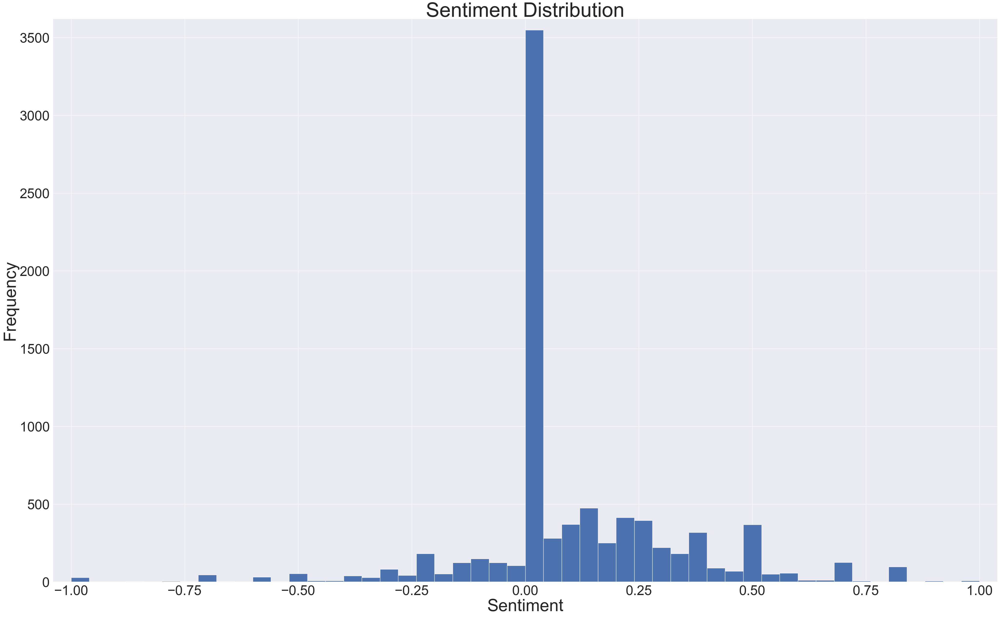

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# graph the sentiment distribution
sns.set()
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.xlabel('Sentiment', fontsize=50)
plt.xticks(fontsize=40)
plt.ylabel('Frequency', fontsize=50)
plt.yticks(fontsize=40)
plt.hist(df_sentiment['sentiment'], bins=50)
plt.title('Sentiment Distribution', fontsize=60)
plt.show()

In [11]:
# lets look at the data without 0 sentiment
df_sentiment_2 = df_sentiment.loc[df_sentiment['sentiment'] != 0]

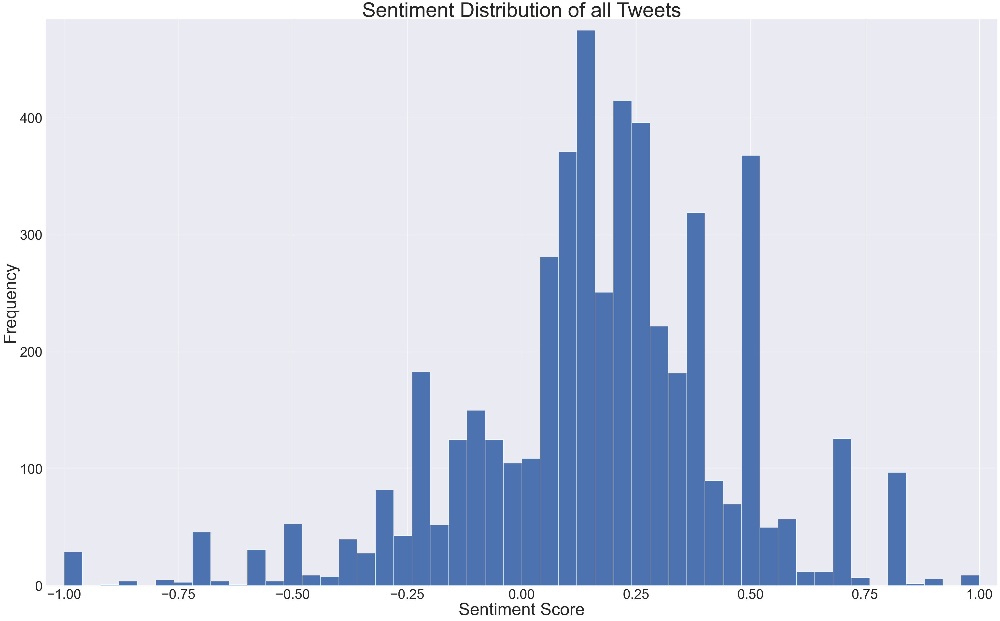

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.xlabel('Sentiment Score', fontsize=50)
plt.xticks(fontsize=40)
plt.ylabel('Frequency', fontsize=50)
plt.yticks(fontsize=40)
plt.hist(df_sentiment_2['sentiment'], bins=50)
plt.title('Sentiment Distribution of all Tweets', fontsize=60)
plt.show()

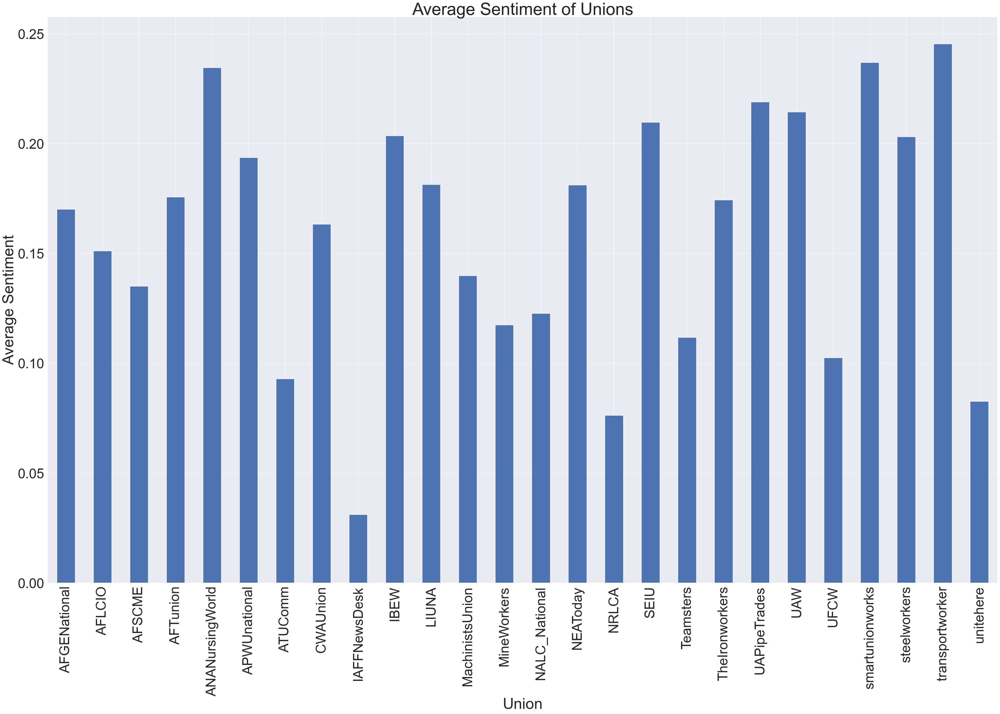

In [13]:
union_avg = df_sentiment_2.groupby('Union')['sentiment'].mean().plot(kind='bar', figsize=(50,30))



plt.xlabel('Union', fontsize=45)
plt.ylabel('Average Sentiment', fontsize=45)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.title('Average Sentiment of Unions', fontsize=50)
plt.show()

In [14]:
# looking at word count and length of tweet 
df['word_count'] = df['clean_text'].apply(lambda x: len(str(x).split()))
df['tweet_len'] = df['clean_text'].astype(str).apply(len)

# apply to sentiment df
df_sentiment['word_count'] = df_sentiment['clean_text'].apply(lambda x: len(str(x).split()))
df_sentiment['tweet_len'] = df_sentiment['clean_text'].astype(str).apply(len)

C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\3352131280.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sentiment['word_count'] = df_sentiment['clean_text'].apply(lambda x: len(str(x).split()))
C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\3352131280.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sentiment['tweet_len'] = df_sentiment['clean_text'].astype(str).apply(len)


In [15]:
df.head()

,index,Time,Text,Entities,Public Metrics,Union,clean_text,word_count,tweet_len
0,0,2020-10-09T21:24:36.000Z,These members of Congress are standing up and ...,"{'urls': [{'start': 110, 'end': 133, 'url': 'h...","{'retweet_count': 3, 'reply_count': 0, 'like_c...",AFGENational,members congress standing demanding halt reope...,10,76
1,1,2022-06-22T17:38:01.000Z,EPA lab work in Houston is suffering as plans ...,"{'hashtags': [{'start': 84, 'end': 87, 'tag': ...","{'retweet_count': 0, 'reply_count': 0, 'like_c...",AFGENational,epa lab work houston suffering plans relocate ...,9,63
2,2,2022-06-16T19:41:01.000Z,Learn more about the EPA Council's upcoming co...,"{'urls': [{'start': 63, 'end': 86, 'url': 'htt...","{'retweet_count': 1, 'reply_count': 0, 'like_c...",AFGENational,learn epa councils upcoming contract campaign,6,45
3,3,2022-06-10T19:14:01.000Z,AFGE EPA members are gearing up for contract n...,"{'hashtags': [{'start': 114, 'end': 117, 'tag'...","{'retweet_count': 2, 'reply_count': 0, 'like_c...",AFGENational,afge epa members gearing contract negotiations...,9,62
4,4,2022-04-25T18:05:03.000Z,AFGE EPA leaders are pushing for a clause in t...,"{'hashtags': [{'start': 131, 'end': 134, 'tag'...","{'retweet_count': 2, 'reply_count': 0, 'like_c...",AFGENational,afge epa leaders pushing clause union contract...,12,97


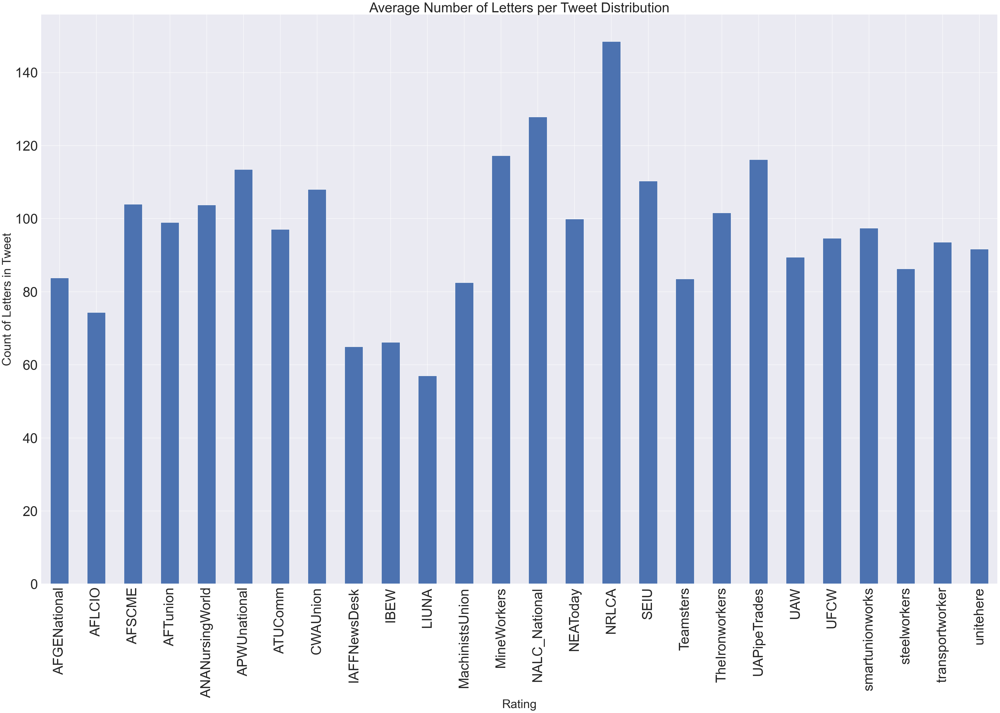

In [16]:
# Graphing tweet length

letter_avg = df.groupby('Union')['tweet_len'].mean().plot(kind='bar', figsize=(50,30))
plt.xlabel('Rating', fontsize=35)
plt.ylabel('Count of Letters in Tweet', fontsize=35)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.title('Average Number of Letters per Tweet Distribution', fontsize=40)
plt.show()

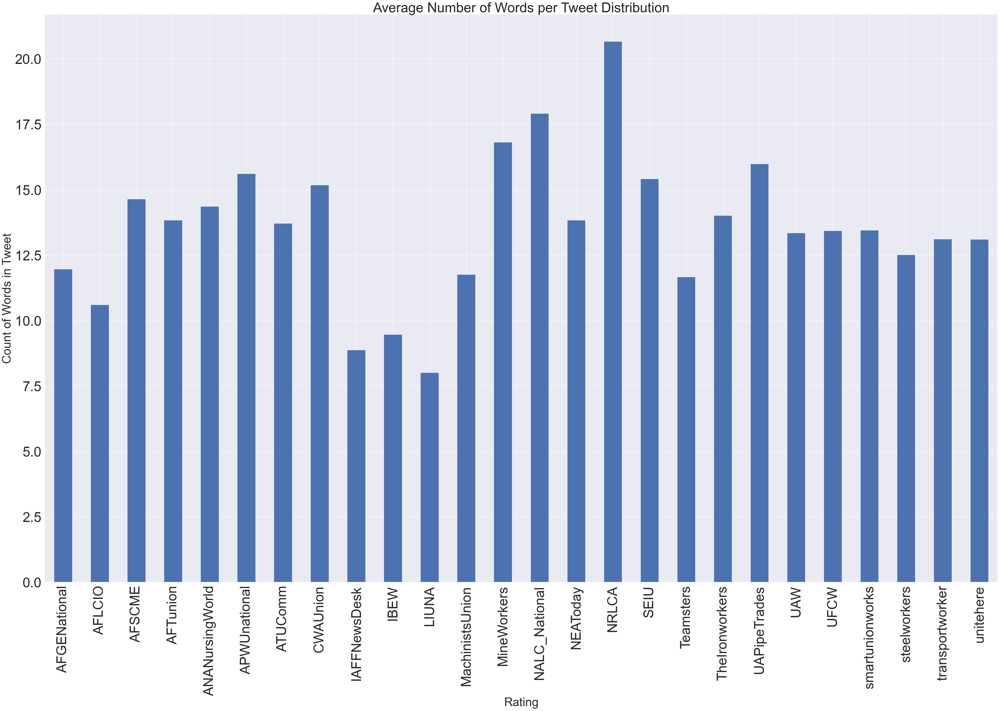

In [17]:
# graphic word count

word_avg = df.groupby('Union')['word_count'].mean().plot(kind='bar', figsize=(50,30))
plt.xlabel('Rating', fontsize=35)
plt.ylabel('Count of Words in Tweet', fontsize=35)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.title('Average Number of Words per Tweet Distribution', fontsize=40)
plt.show()

In [23]:
# correlating word/review length, sentiment 

correlation = df_sentiment[['Union','sentiment', 'tweet_len', 'word_count']].corr()
mask = np.zeros_like(correlation, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(50,30))
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
sns.heatmap(correlation, cmap='coolwarm', annot=True, annot_kws={"size": 40}, linewidths=10, vmin=-1.5, mask=mask)

C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\1103894050.py:4: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  mask = np.zeros_like(correlation, dtype=np.bool)


AttributeError: module 'numpy' has no attribute 'bool'.
`np.bool` was a deprecated alias for the builtin `bool`. To avoid this error in existing code, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

# looking at the most common words

In [24]:
df['clean_text_list'] = [l.split() for l in df['clean_text']]

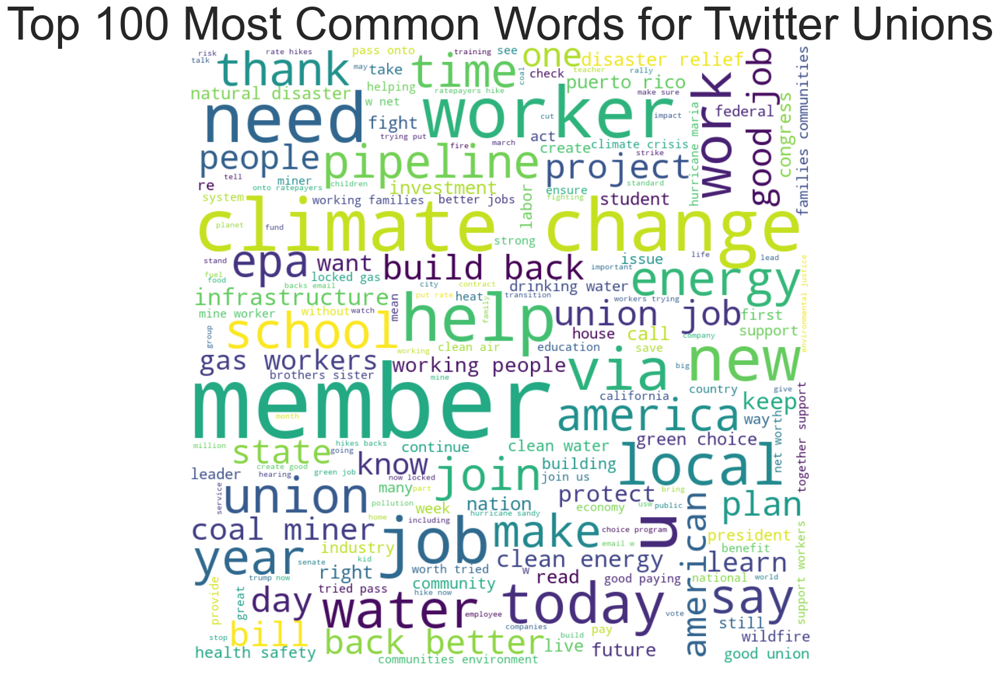

In [25]:
# creating a wordcloud of the most common words
words = df['clean_text_list']
allwords = []
for wordlist in words:
    allwords += wordlist

text = ' '.join(allwords)


mostcommon = FreqDist(text).most_common(100)

# create a WordCloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)


fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words for Twitter Unions', fontsize = 50)
plt.tight_layout(pad=0)
plt.show()

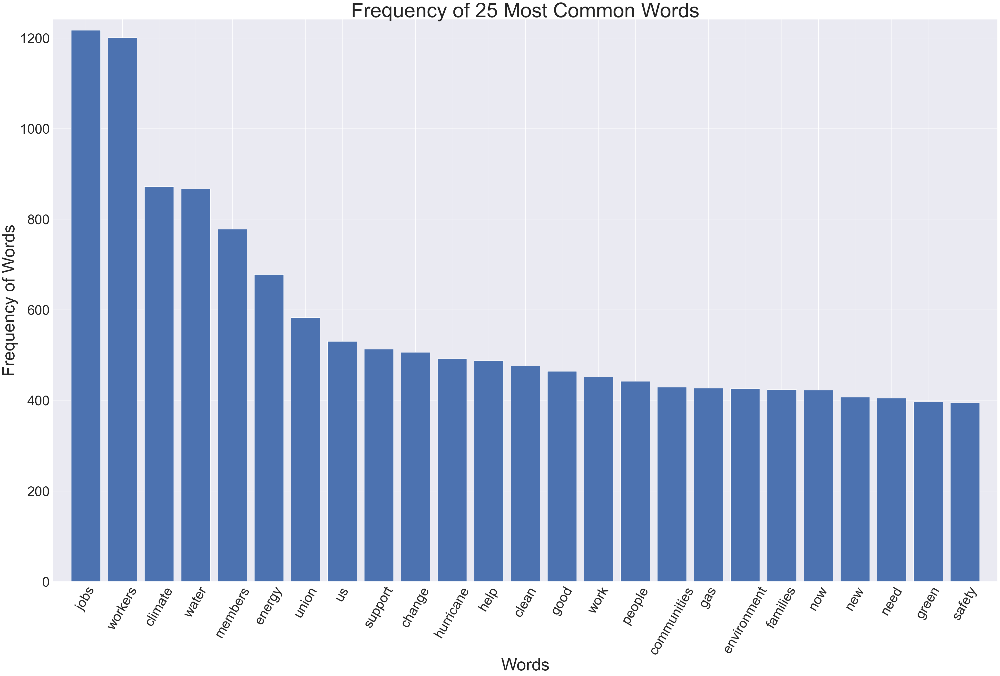

In [26]:
# plotting the frequency of the 25 most common words

mostcommon_small = FreqDist(allwords).most_common(25)
x, y = zip(*mostcommon_small)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 25 Most Common Words', fontsize=60)
plt.show()

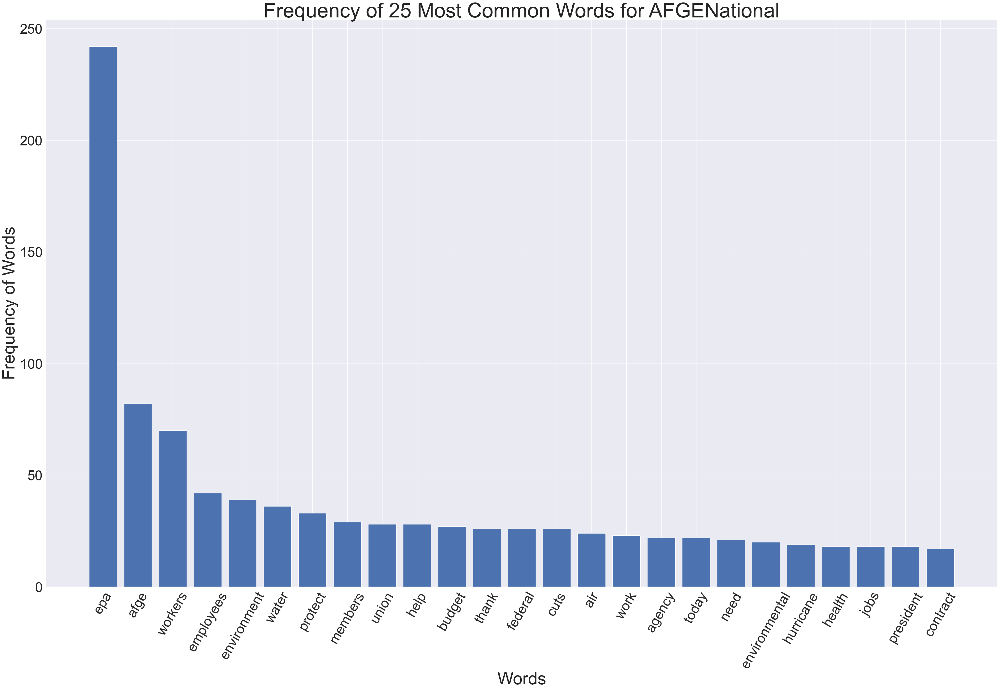

In [27]:
# pltting most common words for each agency

# testing out the first one for AFGENational

group_by = df.groupby('Union')['clean_text'].apply(lambda x: Counter(' '.join(x).split()).most_common(25))
group_by_0 = group_by.iloc[0]
words0 = list(zip(*group_by_0))[0]
freq0 = list(zip(*group_by_0))[1]
plt.figure(figsize=(50,30))
plt.bar(words0, freq0)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title(f'Frequency of 25 Most Common Words for {group_by.index[0]}', fontsize=60)
plt.show()

In [28]:
# looking at indexes
print(group_by.index)

for union in group_by.index:
    print(union)

Index(['AFGENational', 'AFLCIO', 'AFSCME', 'AFTunion', 'ANANursingWorld',
       'APWUnational', 'ATUComm', 'CWAUnion', 'IAFFNewsDesk', 'IBEW', 'LIUNA',
       'MachinistsUnion', 'MineWorkers', 'NALC_National', 'NEAToday', 'NRLCA',
       'SEIU', 'Teamsters', 'TheIronworkers', 'UAPipeTrades', 'UAW', 'UFCW',
       'smartunionworks', 'steelworkers', 'transportworker', 'unitehere'],
      dtype='object', name='Union')
AFGENational
AFLCIO
AFSCME
AFTunion
ANANursingWorld
APWUnational
ATUComm
CWAUnion
IAFFNewsDesk
IBEW
LIUNA
MachinistsUnion
MineWorkers
NALC_National
NEAToday
NRLCA
SEIU
Teamsters
TheIronworkers
UAPipeTrades
UAW
UFCW
smartunionworks
steelworkers
transportworker
unitehere


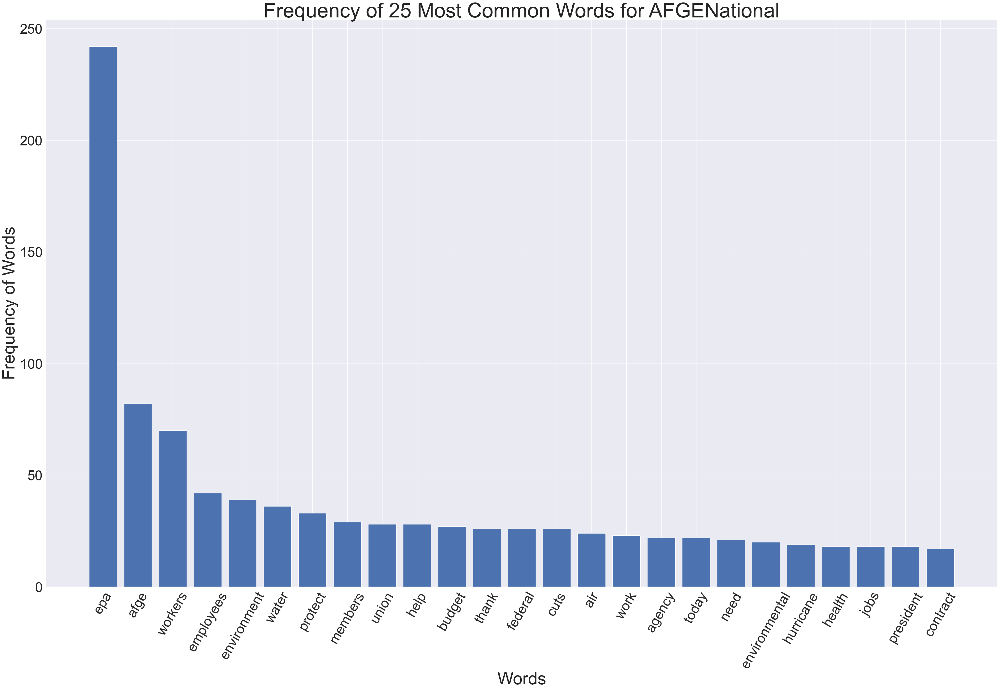

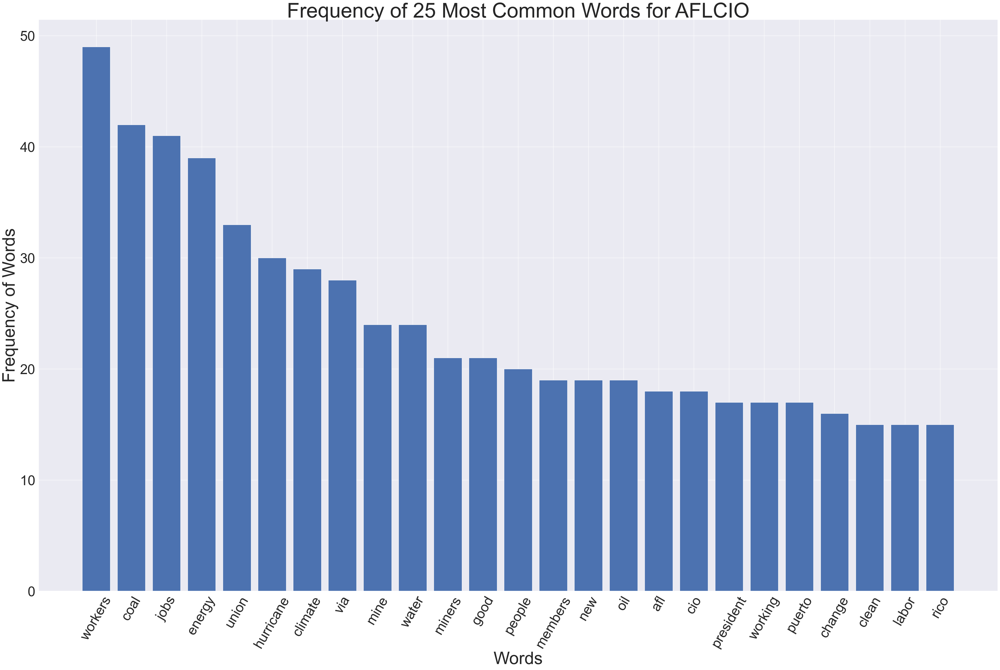

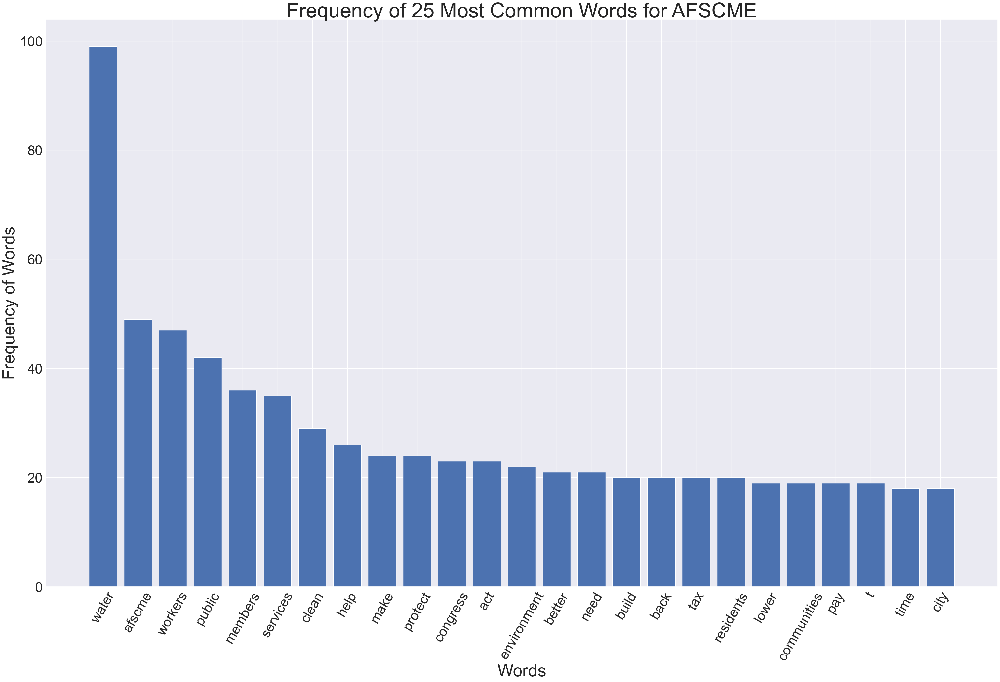

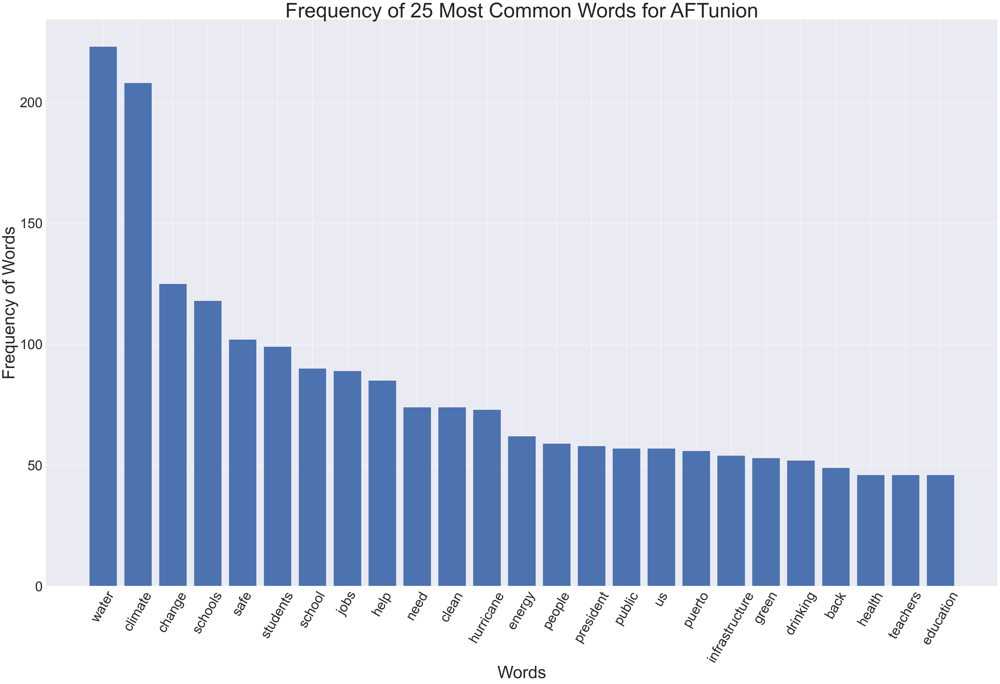

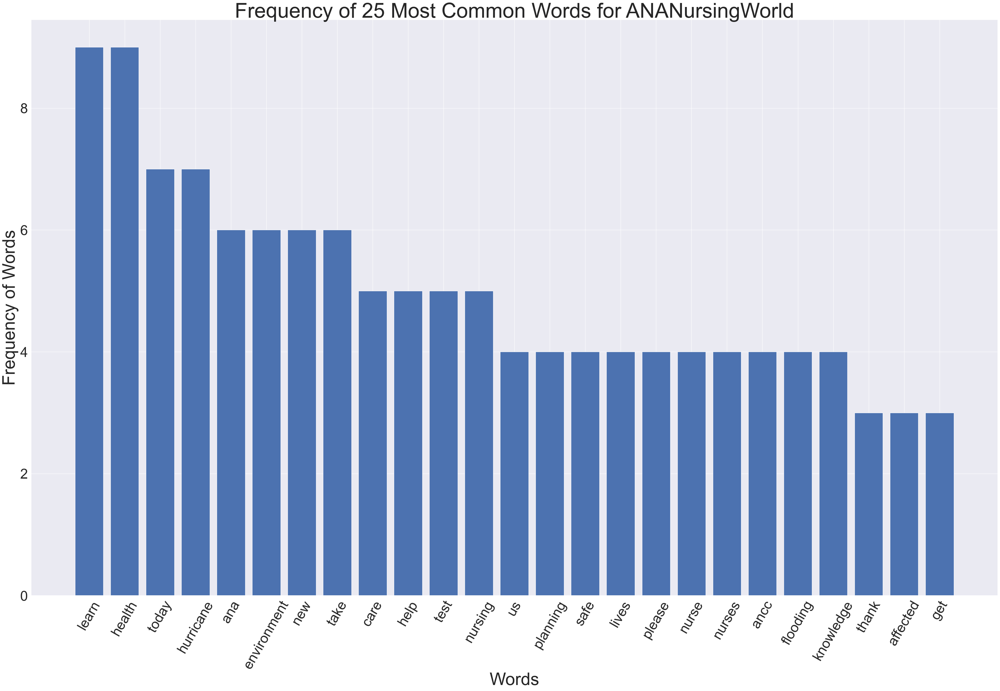

...

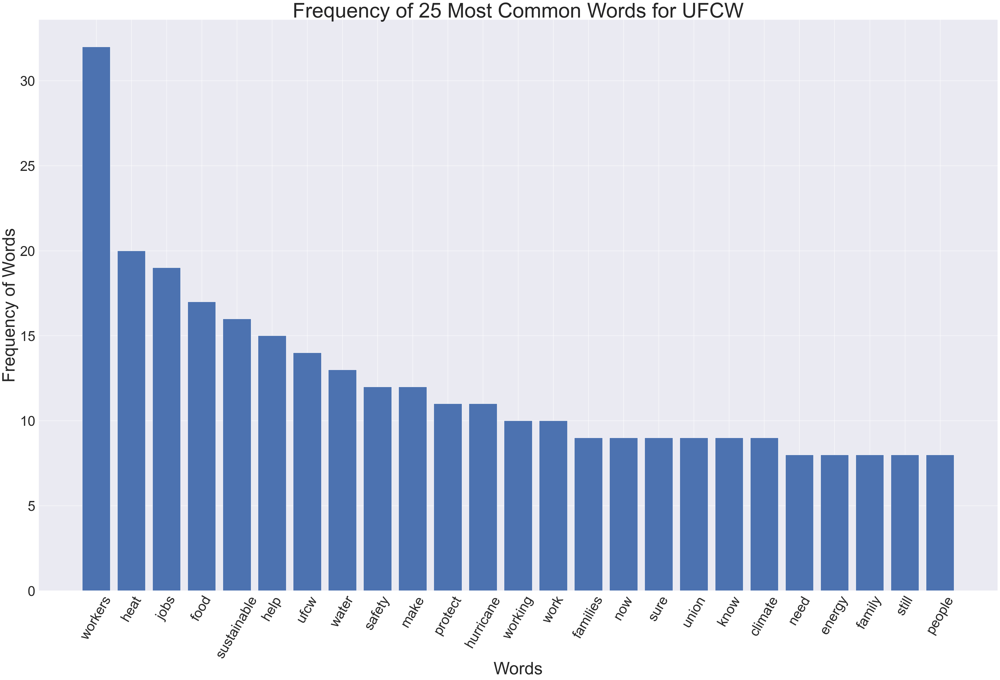

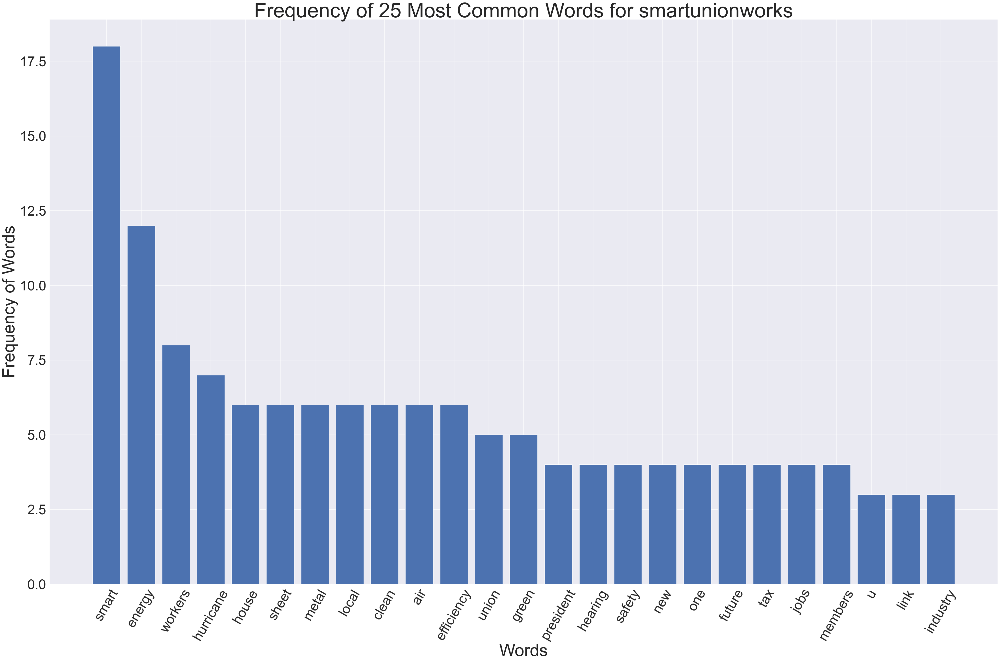

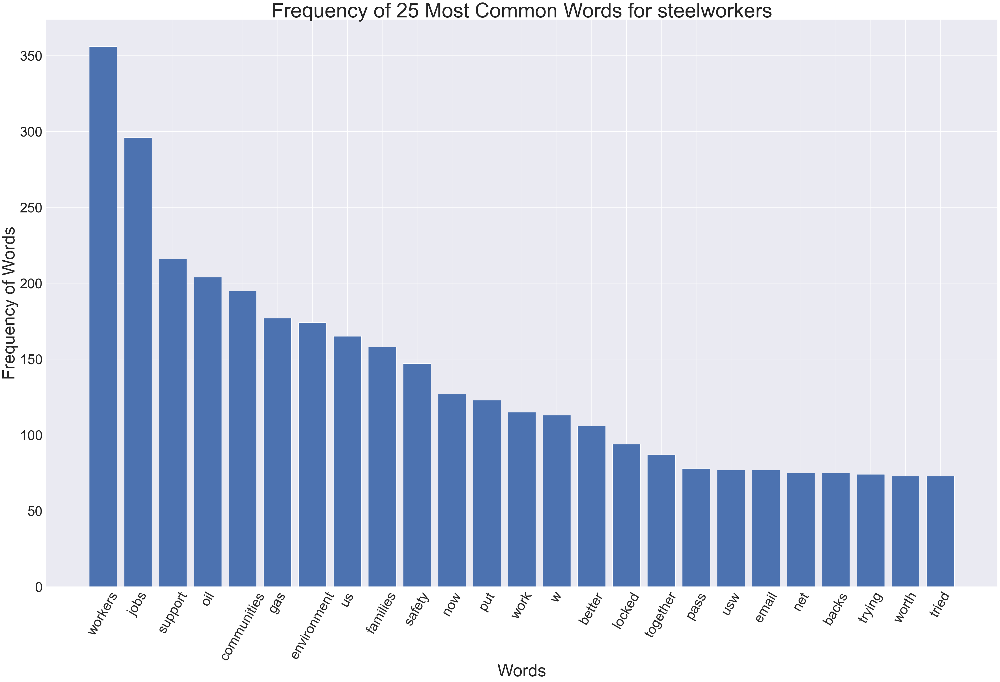

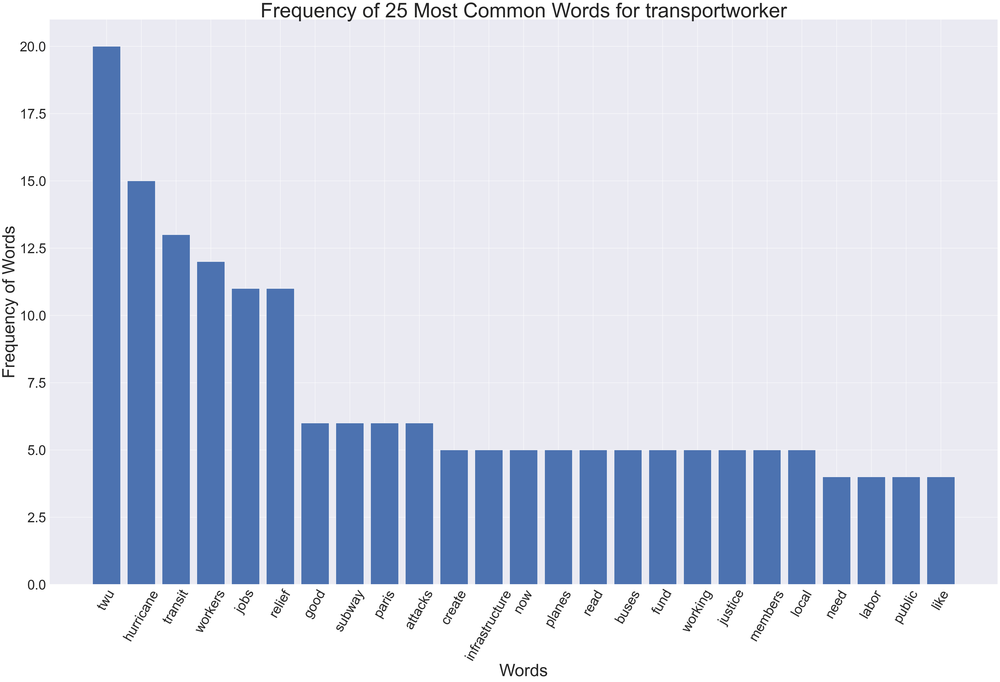

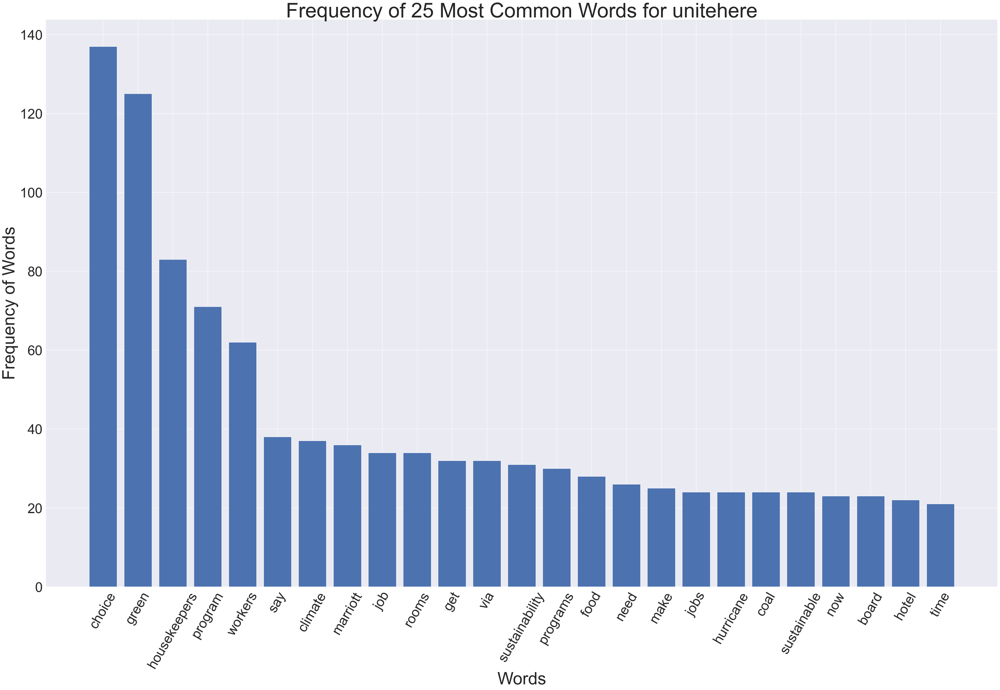

In [29]:
# group by clean union, selecting clean text
group_by = df.groupby('Union')['clean_text'].apply(lambda x: Counter(' '.join(x).split()).most_common(25))

# loop through each union

for i in range(len(group_by)):
    group_by_num = group_by.iloc[i]
    words = list(zip(*group_by_num))[0]
    freq = list(zip(*group_by_num))[1]
    plt.figure(figsize=(50,30))
    plt.bar(words, freq)
    plt.xlabel('Words', fontsize=50)
    plt.ylabel('Frequency of Words', fontsize=50)
    plt.yticks(fontsize=40)
    plt.xticks(rotation=60, fontsize=40)
    plt.title(f'Frequency of 25 Most Common Words for {group_by.index[i]}', fontsize=60)
    plt.show()
    


C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\204575375.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(words, rotation=60, fontsize=12)
C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\204575375.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(words, rotation=60, fontsize=12)
C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\204575375.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(words, rotation=60, fontsize=12)
C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\204575375.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(words, rotation=60, fontsize=12)
C:\Users\Jeffrey\AppData\Local\Temp\ipykernel_9916\204575375.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i].set_xticklabels(words, rotation=60, fontsize

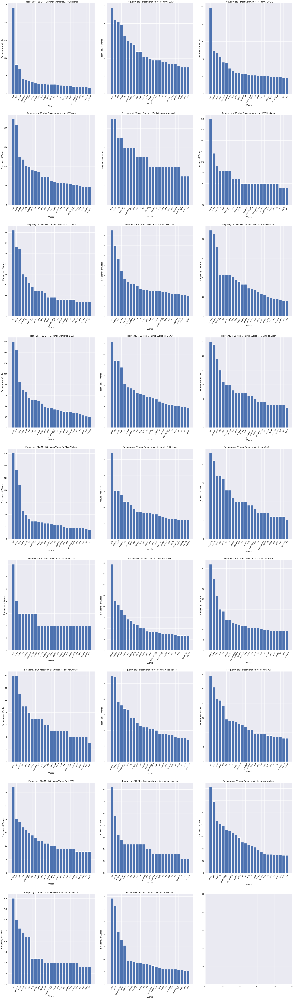

In [30]:
import matplotlib.pyplot as plt
import math

# group by clean union, selecting clean text
group_by = df.groupby('Union')['clean_text'].apply(lambda x: Counter(' '.join(x).split()).most_common(25))

# calculate number of rows and columns needed for subplots
n_plots = len(group_by)
n_cols = 3
n_rows = math.ceil(n_plots / n_cols)

# create subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, 100))
axs = axs.ravel()

# loop through each union
for i in range(n_plots):
    group_by_num = group_by.iloc[i]
    words = list(zip(*group_by_num))[0]
    freq = list(zip(*group_by_num))[1]
    axs[i].bar(words, freq)
    axs[i].set_xlabel('Words', fontsize=15)
    axs[i].set_ylabel('Frequency of Words', fontsize=15)
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    axs[i].set_xticklabels(words, rotation=60, fontsize=12)
    axs[i].set_title(f'Frequency of 25 Most Common Words for {group_by.index[i]}', fontsize=15)

# adjust the layout and spacing of subplots
fig.tight_layout(pad=3.0)
plt.show()
